<a href="https://colab.research.google.com/github/zinnia1223/Data-Science/blob/master/ReAgain_384_wand_20220306_Pneumothorax_keras_Hybrid_SWIN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Disclaimer
Code adopted from https://www.kaggle.com/pradjaeyeonhwang/tf-hybrid-efficientnet-swin-transformer-gradcam/edit

In [1]:
!pip install -U tensorflow-addons

     |████████████████████████████████| 1.1 MB 15.1 MB/s 


In [2]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow import keras
from tensorflow.keras import layers

In [3]:
!pip install wandb
!pip install --upgrade wandb

     |████████████████████████████████| 1.7 MB 15.0 MB/s 
     |████████████████████████████████| 144 kB 56.6 MB/s 
     |████████████████████████████████| 181 kB 70.4 MB/s 
     |████████████████████████████████| 63 kB 2.2 MB/s 
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8806 sha256=7183483a2875ac05e3d08e6c56895efbbaa9d953a38fdd9281122d753dffd050
  Stored in directory: /root/.cache/pip/wheels/3e/31/09/fa59cef12cdcfecc627b3d24273699f390e71828921b2cbba2
Successfully built pathtools


In [4]:
import os, random, cv2
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import tensorflow.keras.backend as K 
import tensorflow as tf; print(tf.__version__)
from tensorflow.keras import layers 
from tensorflow import keras 

import matplotlib.pyplot as plt
from numpy.random import rand 
import matplotlib.cm as cm
import numpy as np 

physical_devices = tf.config.list_physical_devices('GPU')
try: 
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    tf.config.optimizer.set_jit(True)
except: 
    pass 

seed = 786
tf.random.set_seed(seed)
np.random.seed(seed)
random.seed(seed)

2.8.0


In [ ]:
'''
import pathlib

dataset_url = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"
data_dir = tf.keras.utils.get_file('flower_photos', origin=dataset_url, untar=True)
data_dir = pathlib.Path(data_dir)

image_count = len(list(data_dir.glob('*/*.jpg')))
print('Total Samples: ', image_count)
'''

'\nimport pathlib\n\ndataset_url = "https://storage.googleapis.com/download.tensorflow.org/example_images/flower_photos.tgz"\ndata_dir = tf.keras.utils.get_file(\'flower_photos\', origin=dataset_url, untar=True)\ndata_dir = pathlib.Path(data_dir)\n\nimage_count = len(list(data_dir.glob(\'*/*.jpg\')))\nprint(\'Total Samples: \', image_count)\n'

#Dataset 만들기

In [5]:
import shutil
import os

#shutil.rmtree('/content/drive/MyDrive/Programming and AI/Pneumothorax_pratice/data/ext_test/.ipynb_checkpoints')

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


##Parameters

In [7]:
root_path = '/content/drive/MyDrive/Programming and AI/Pneumothorax_pratice/data'
train_path = '/content/drive/MyDrive/Programming and AI/Pneumothorax_pratice/data/train'
test_path = '/content/drive/MyDrive/Programming and AI/Pneumothorax_pratice/data/ext_test'

class_names = ['Normal', 'Pneumothorax']
class_number = len(class_names)
img_size = 384
image_size = (img_size, img_size)
img_channels = 3
input_shape = (img_size, img_size, img_channels)
validation_split = 0.2
image_dim = (img_size, img_size)
AUTOTUNE = tf.data.AUTOTUNE
batch_size = 8
epochs = 100

In [8]:
import os, re, glob
#import cv2
import numpy as np
from sklearn.model_selection import train_test_split
import pandas as pd
from tensorflow import keras

train_set = keras.utils.image_dataset_from_directory(
    train_path,
    #labels = 'inferred',
    label_mode = 'categorical', # label을 onehot coding으로  변경
    #class_names = class_names,
    image_size = image_size,
    shuffle = True,
    crop_to_aspect_ratio = True,
    interpolation = 'bilinear',
    validation_split = validation_split,
    subset = 'training',
    #color_mode = 'grayscale',   # 이상하게 grayscale로 하면 그림이 안나오는뎅
    seed = seed
)



val_set = keras.utils.image_dataset_from_directory(
    train_path,
    #labels = 'inferred',
    label_mode = 'categorical',
    #class_names = class_names,
    image_size = image_size,
    validation_split = validation_split,
    shuffle = True,
    crop_to_aspect_ratio = False,
    interpolation = 'bilinear',
    subset = 'validation',
    #color_mode = 'grayscale',
    seed = seed   
)


test_set = keras.utils.image_dataset_from_directory(
    test_path,
    #labels = 'inferred',
    label_mode = 'categorical',
    image_size = image_size,
    #class_names = class_names,
    shuffle = True,
    #color_mode = 'grayscale',
    crop_to_aspect_ratio = False,
    interpolation = 'bilinear',
    seed = seed
)



Found 751 files belonging to 2 classes.
Using 601 files for training.
Found 751 files belonging to 2 classes.
Using 150 files for validation.
Found 245 files belonging to 2 classes.


In [9]:
tcls_names, vcls_names = train_set.class_names, val_set.class_names
tcls_names, vcls_names

(['Normal', 'Pneumothorax'], ['Normal', 'Pneumothorax'])

In [10]:
plt.figure(figsize=(20, 20))
for images, labels in test_set.take(1):
    print(images.shape, labels.shape)
    print(labels.numpy())

(32, 384, 384, 3) (32, 2)
[[1. 0.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]]


<Figure size 1440x1440 with 0 Axes>

In [ ]:
'''
images, labels = next(iter(train_set.take(1)))
idx = np.random.randint(0, 15, 1)
idx = idx[0]
img = images[idx].numpy().astype("uint8")
img = img[:,:,0]
plt.imshow(img, cmap = 'gray')

#plt.title(class_names[np.argmax(labels[idx], axis = None, out = None)])
plt.show()'''


'\nimages, labels = next(iter(train_set.take(1)))\nidx = np.random.randint(0, 15, 1)\nidx = idx[0]\nimg = images[idx].numpy().astype("uint8")\nimg = img[:,:,0]\nplt.imshow(img, cmap = \'gray\')\n\n#plt.title(class_names[np.argmax(labels[idx], axis = None, out = None)])\nplt.show()'

##Data Augmentation and visualization

In [ ]:
#!pip install -q -U albumentations
#!echo "$(pip freeze | grep albumentations) is successfully installed"
#!pip install --upgrade tensorflow_datasets
#!pip uninstall opencv-python
#!pip install opencv-python
#from albumentations.augmentations.transforms import RandomContrast
#import albumentations as A
#from functools import partial

#AUTOTUNE = tf.data.experimental.AUTOTUNE

In [11]:
#!pip install tf-nightly.
augmentation = tf.keras.Sequential([
                                    #layers.experimental.preprocessing.RandomContrast((0.5, 1.5)),
                                    layers.experimental.preprocessing.RandomFlip(mode='horizontal'),
                                    layers.experimental.preprocessing.RandomRotation((-0.02, 0.02)),
                                    #layers.experimental.preprocessing.Normalization(axis = None),
                                    layers.experimental.preprocessing.RandomZoom((0, 0.1), (0, 0.1), fill_mode = 'constant', interpolation = 'bilinear', fill_value = 0.0),
                                    layers.experimental.preprocessing.Normalization()
])

In [ ]:
'''
import matplotlib.pyplot as plt

plt.figure(figsize = (10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i+1)
        img = images[i].numpy().astype("uint8")
        img = img[:,:,0]  # 이렇게 해야 grayscal image 보임
        plt.imshow(img, cmap ='gray')
        plt.axis('off')
        plt.title(class_names[np.argmax(labels[i], axis = None, out = None)])   
plt.show()
'''

'\nimport matplotlib.pyplot as plt\n\nplt.figure(figsize = (10, 10))\nfor images, labels in train_ds.take(1):\n    for i in range(9):\n        ax = plt.subplot(3, 3, i+1)\n        img = images[i].numpy().astype("uint8")\n        img = img[:,:,0]  # 이렇게 해야 grayscal image 보임\n        plt.imshow(img, cmap =\'gray\')\n        plt.axis(\'off\')\n        plt.title(class_names[np.argmax(labels[i], axis = None, out = None)])   \nplt.show()\n'

In [12]:
train_ds = train_set.shuffle(10*batch_size)
train_ds = train_set.map(lambda x, y: (augmentation(x), y), num_parallel_calls=AUTOTUNE)
train_ds = train_set.prefetch(buffer_size = AUTOTUNE)

#valid_ds = train_ds.map(lambda x, y: (augmentation(x), y), num_parallel_calls=AUTOTUNE)
valid_ds = val_set.prefetch(buffer_size = AUTOTUNE)



## Dataset visualization

(32, 384, 384, 3) (32, 2)


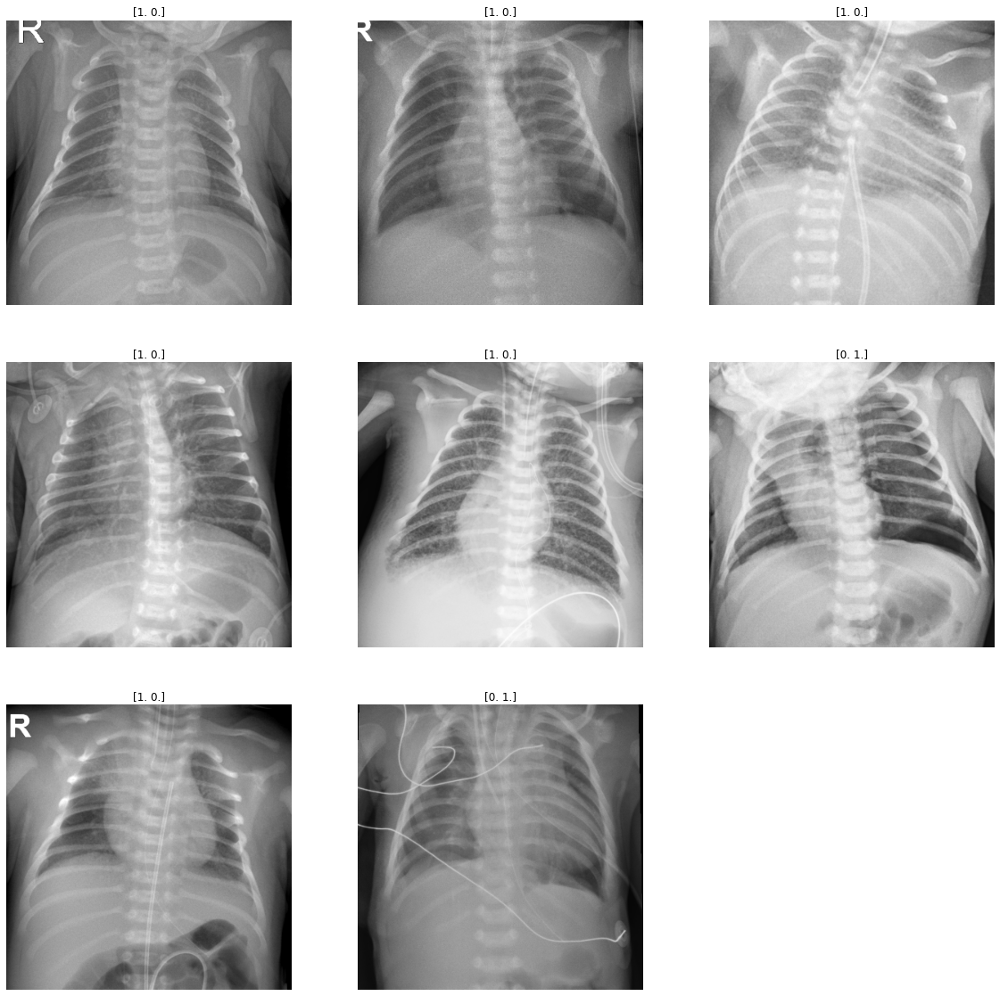

(32, 384, 384, 3) (32, 2)


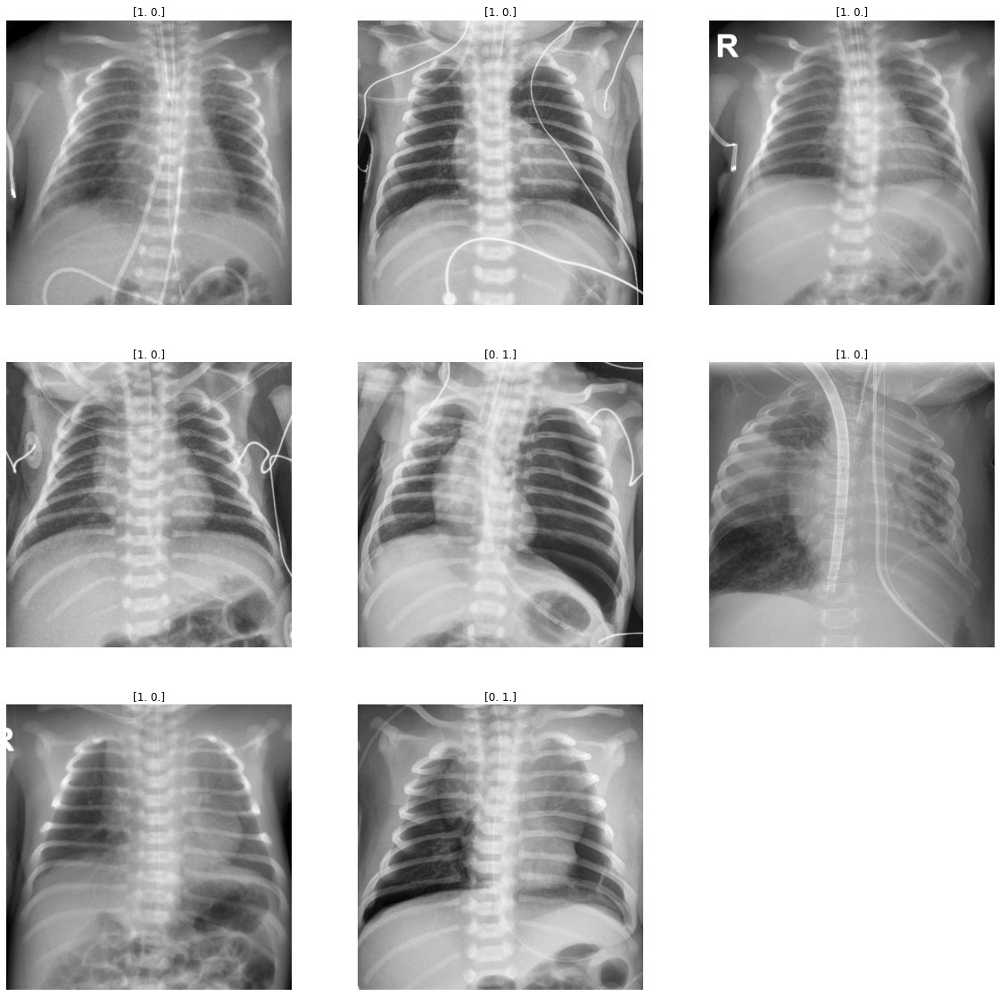

(32, 384, 384, 3) (32, 2)


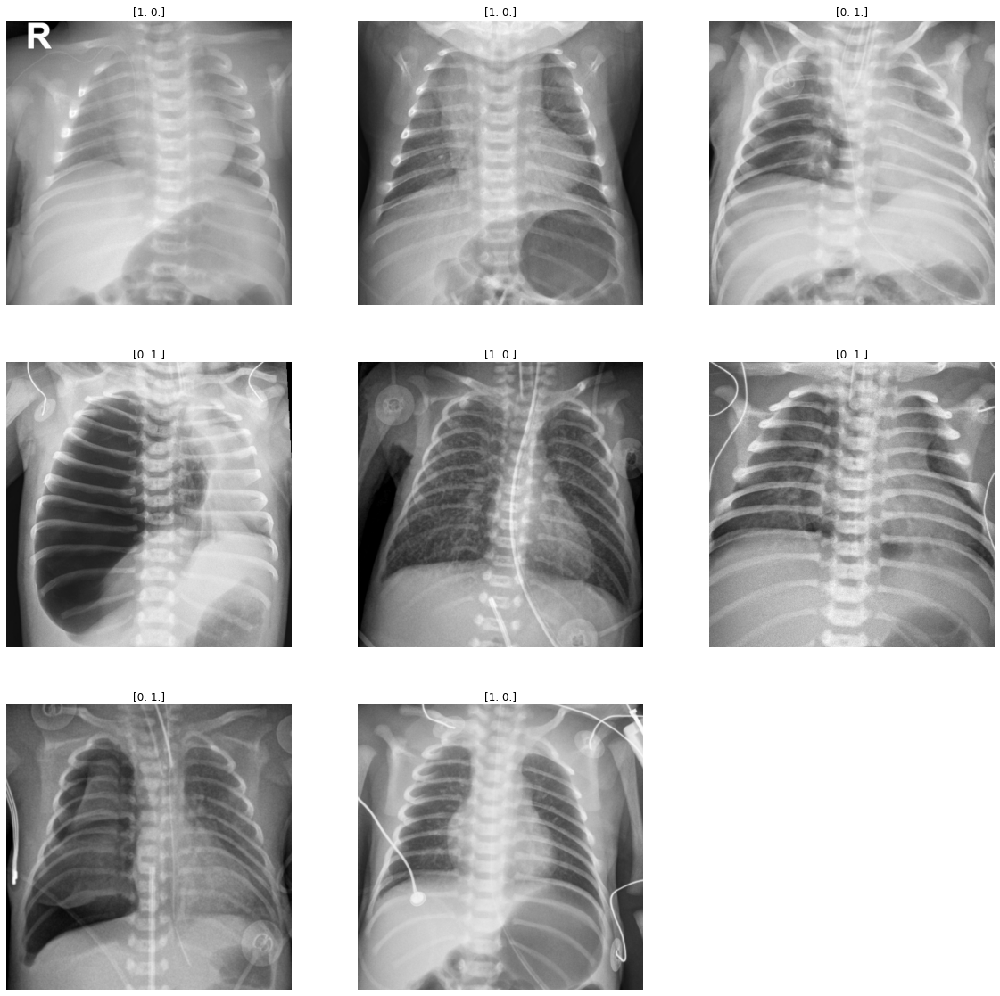

(32, 384, 384, 3) (32, 2)


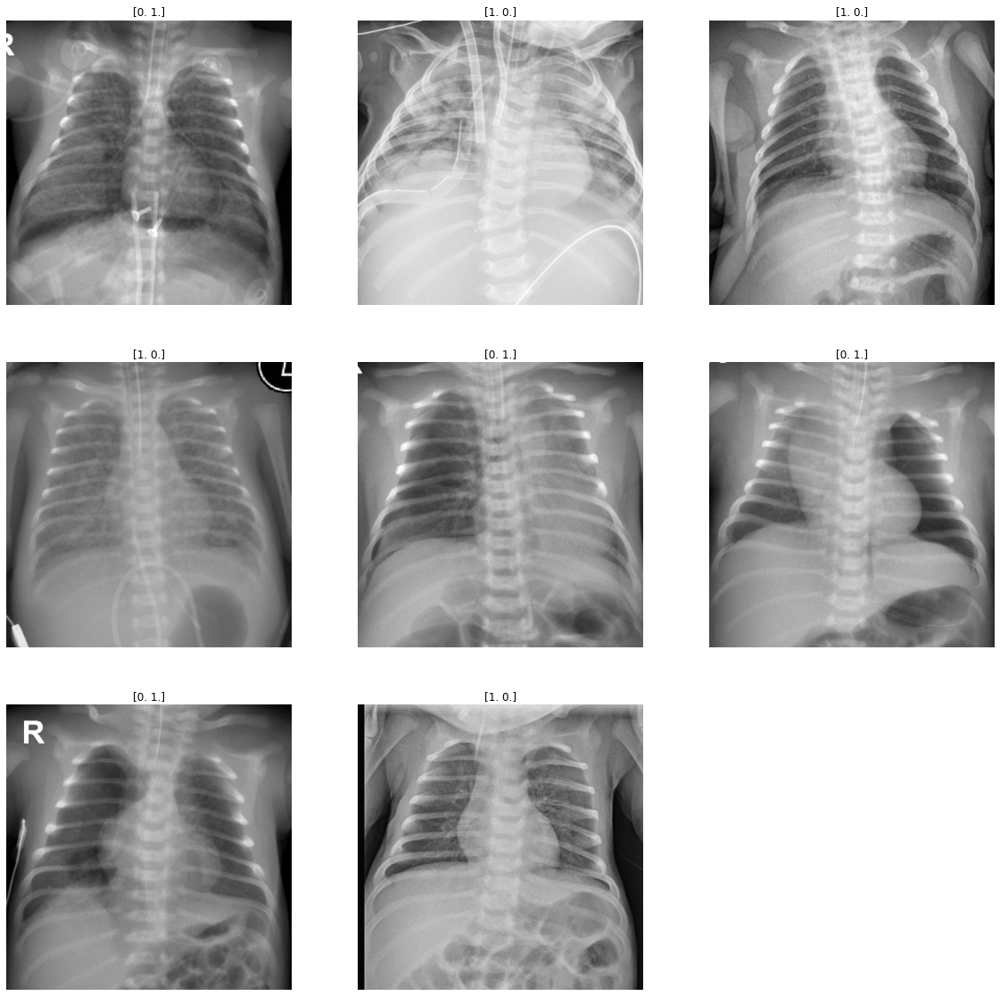

(32, 384, 384, 3) (32, 2)


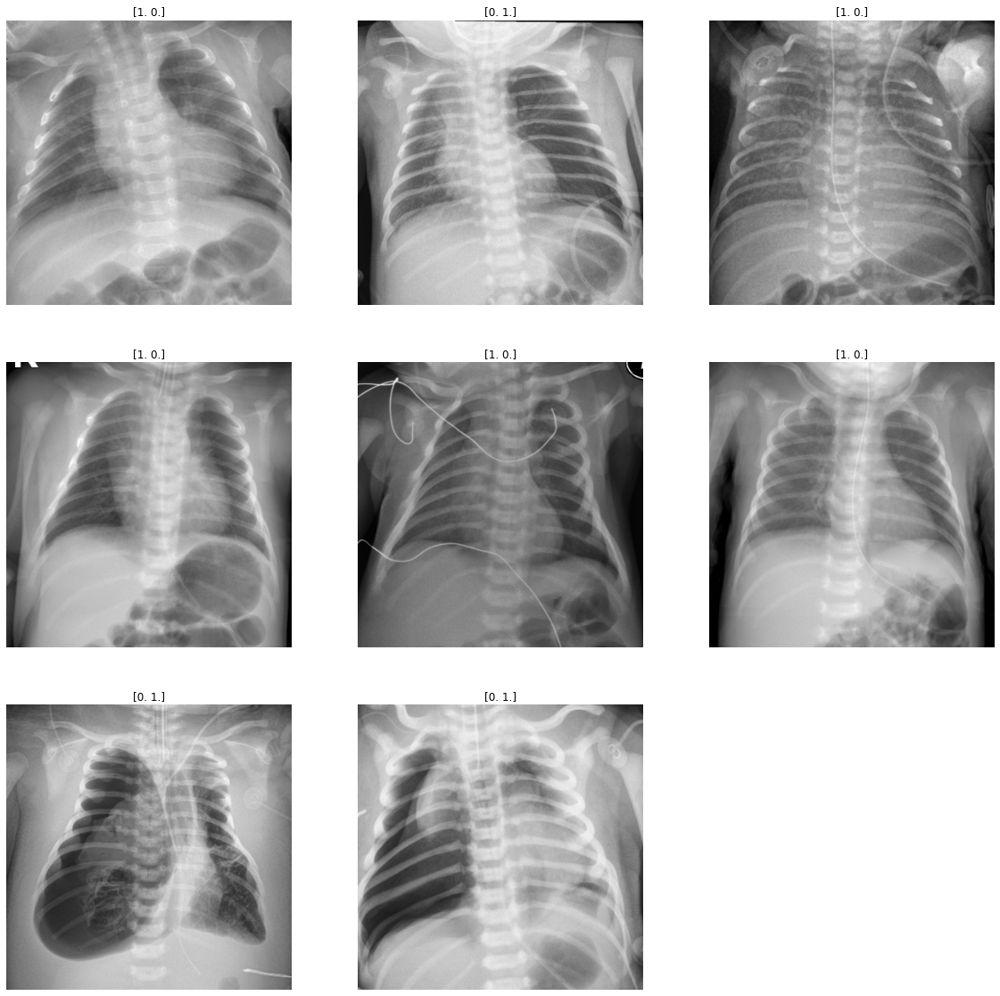

In [13]:
for images, labels in train_ds.take(5):
    print(images.shape, labels.shape)
    plt.figure(figsize=(20, 20))
    for i in range(8):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(labels[i].numpy())
        plt.axis("off")
    plt.show()

(32, 384, 384, 3) (32, 2)


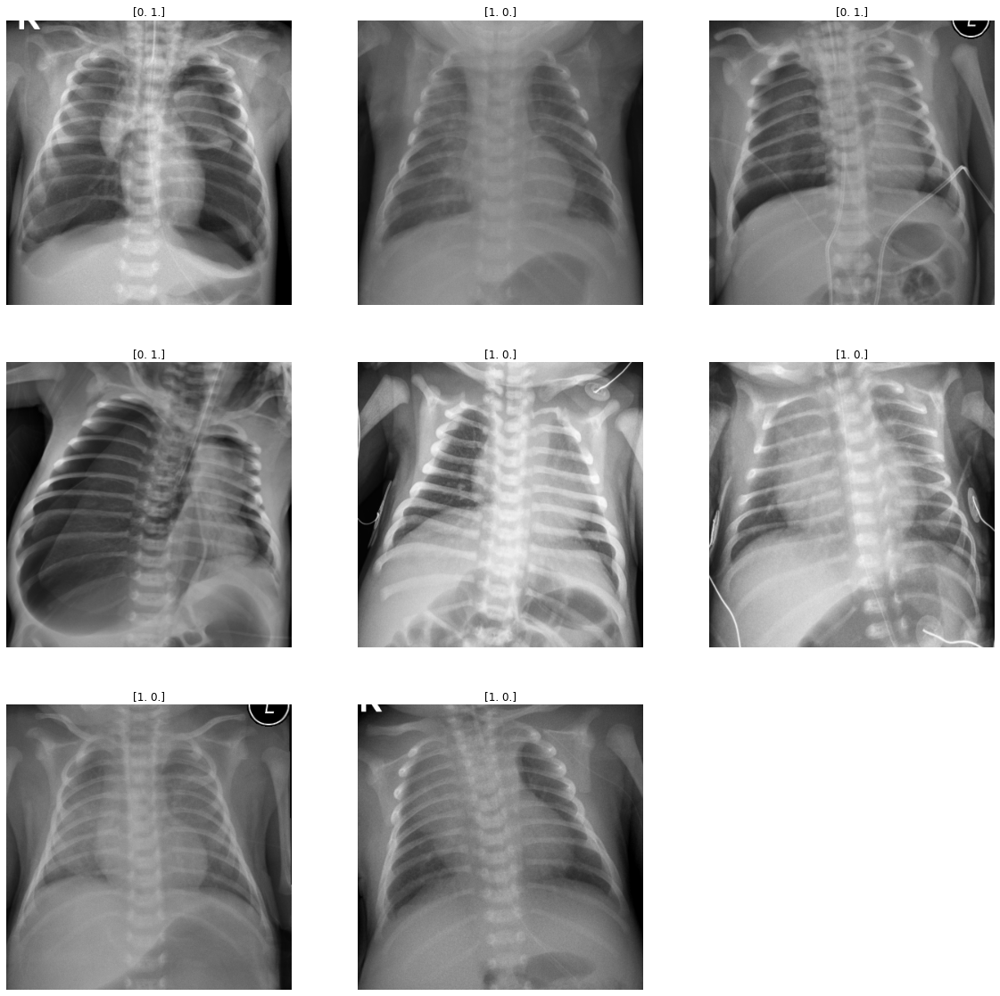

(32, 384, 384, 3) (32, 2)


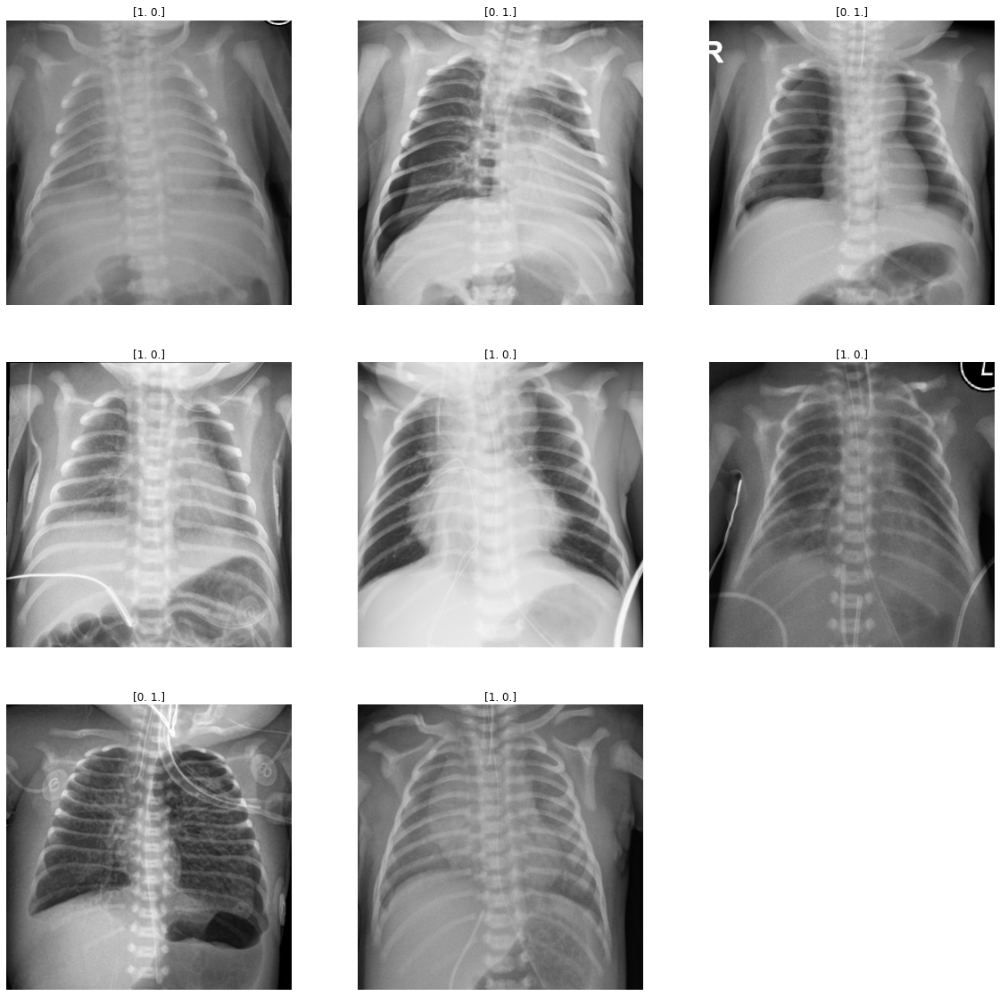

(32, 384, 384, 3) (32, 2)


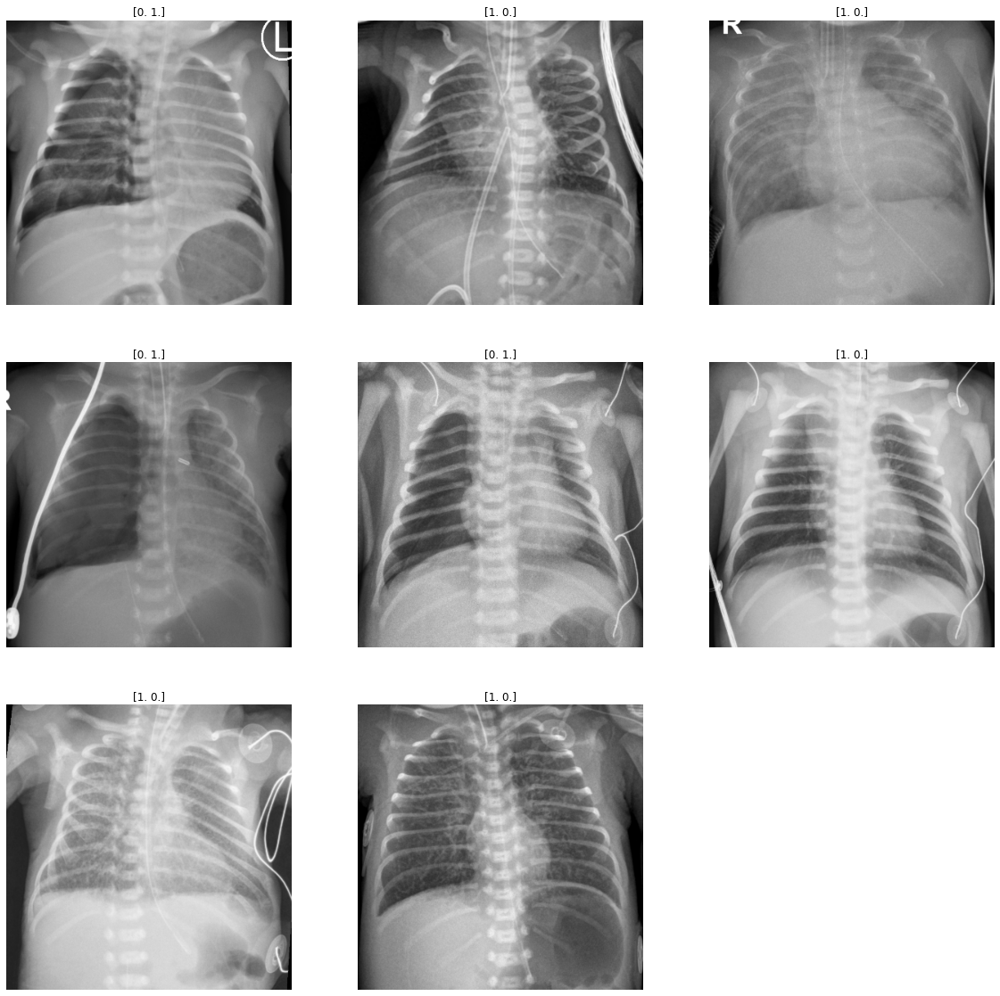

(32, 384, 384, 3) (32, 2)


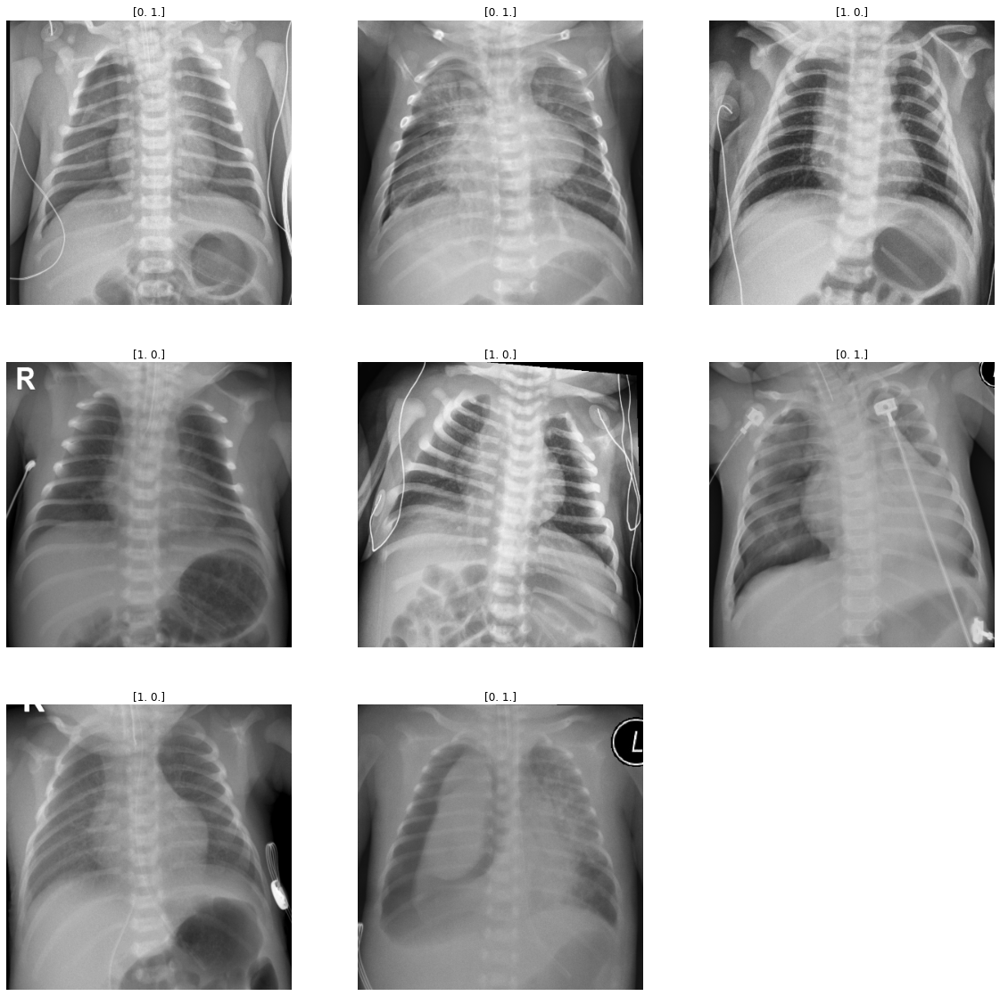

(22, 384, 384, 3) (22, 2)


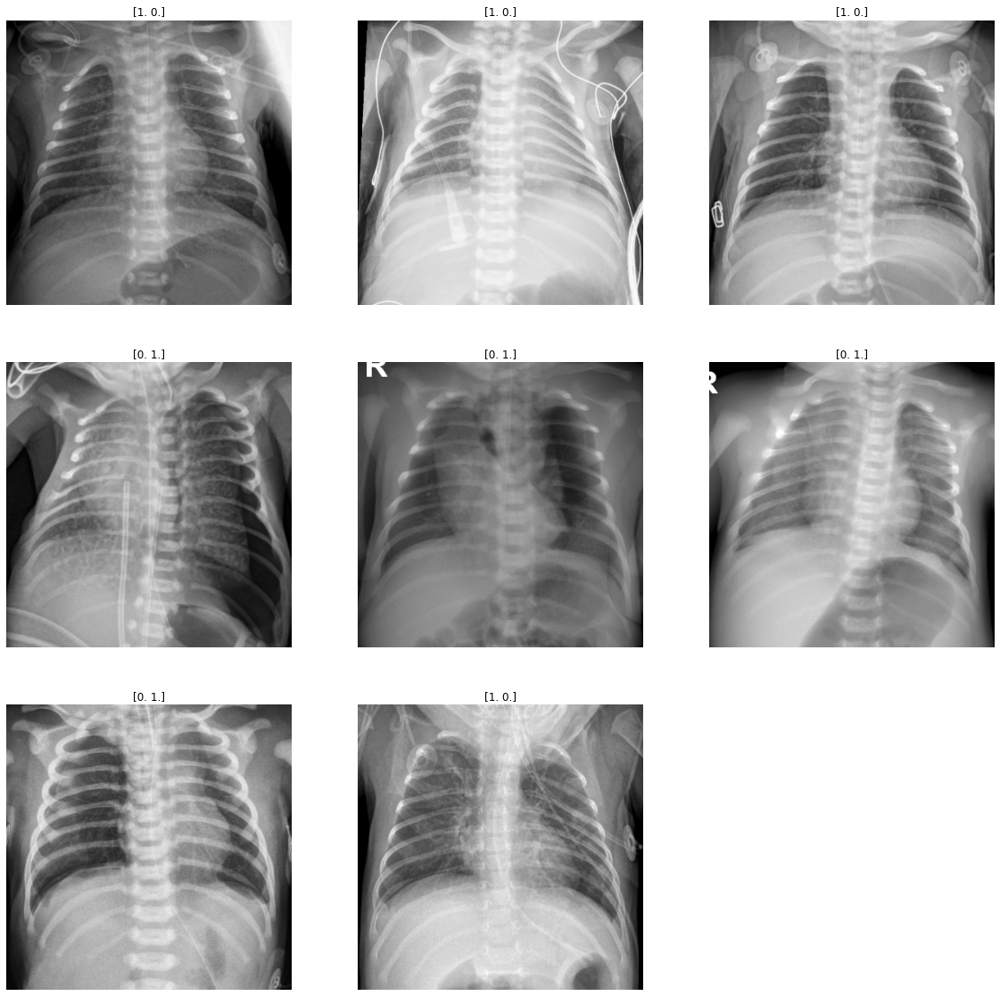

In [14]:
for images, labels in valid_ds.take(5):
    print(images.shape, labels.shape)
    plt.figure(figsize=(20, 20))
    for i in range(8):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(labels[i].numpy())
        plt.axis("off")
    plt.show()

(32, 384, 384, 3) (32, 2)


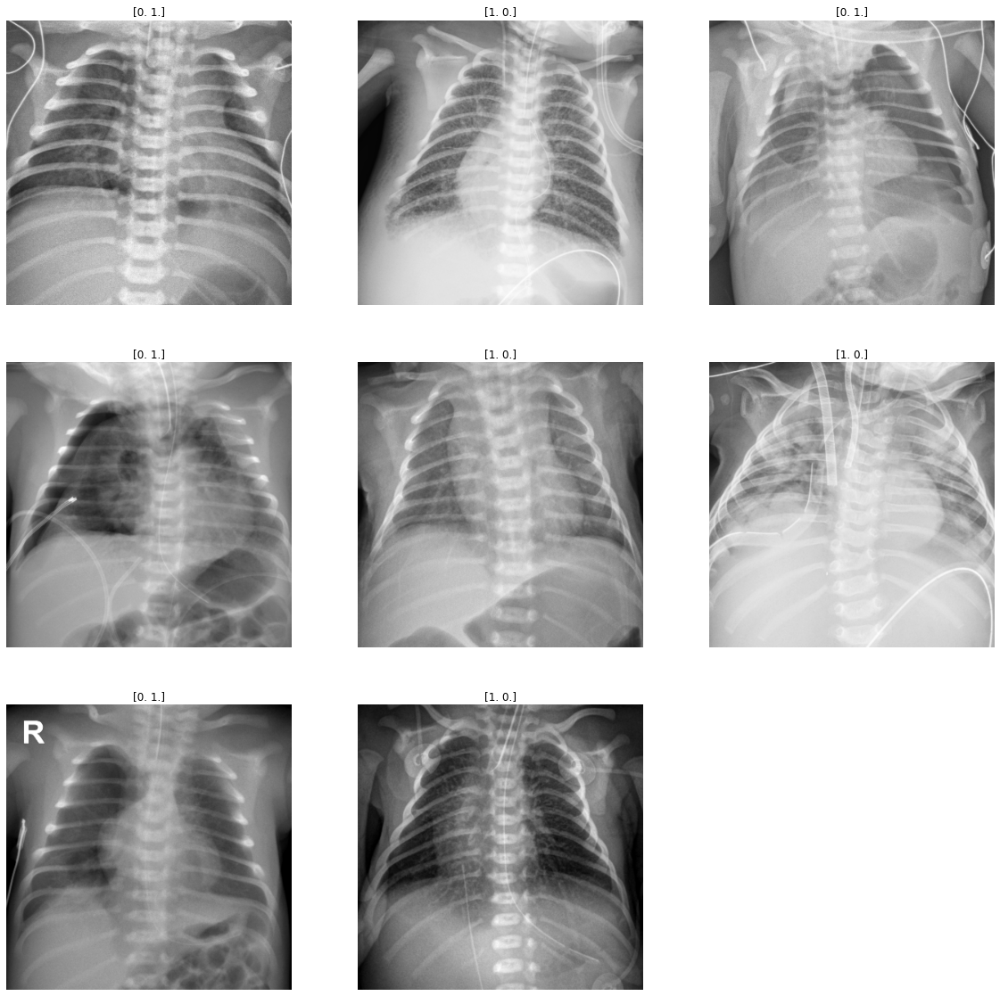

(32, 384, 384, 3) (32, 2)


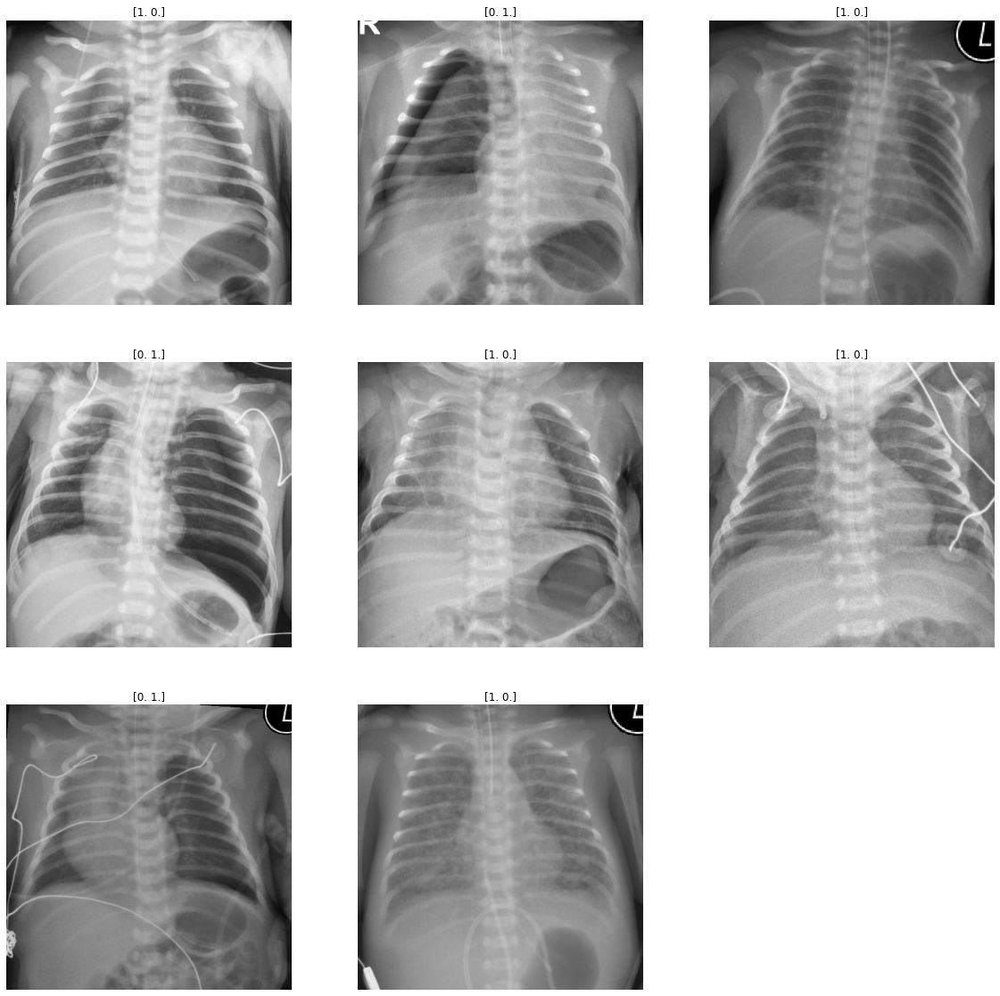

(32, 384, 384, 3) (32, 2)


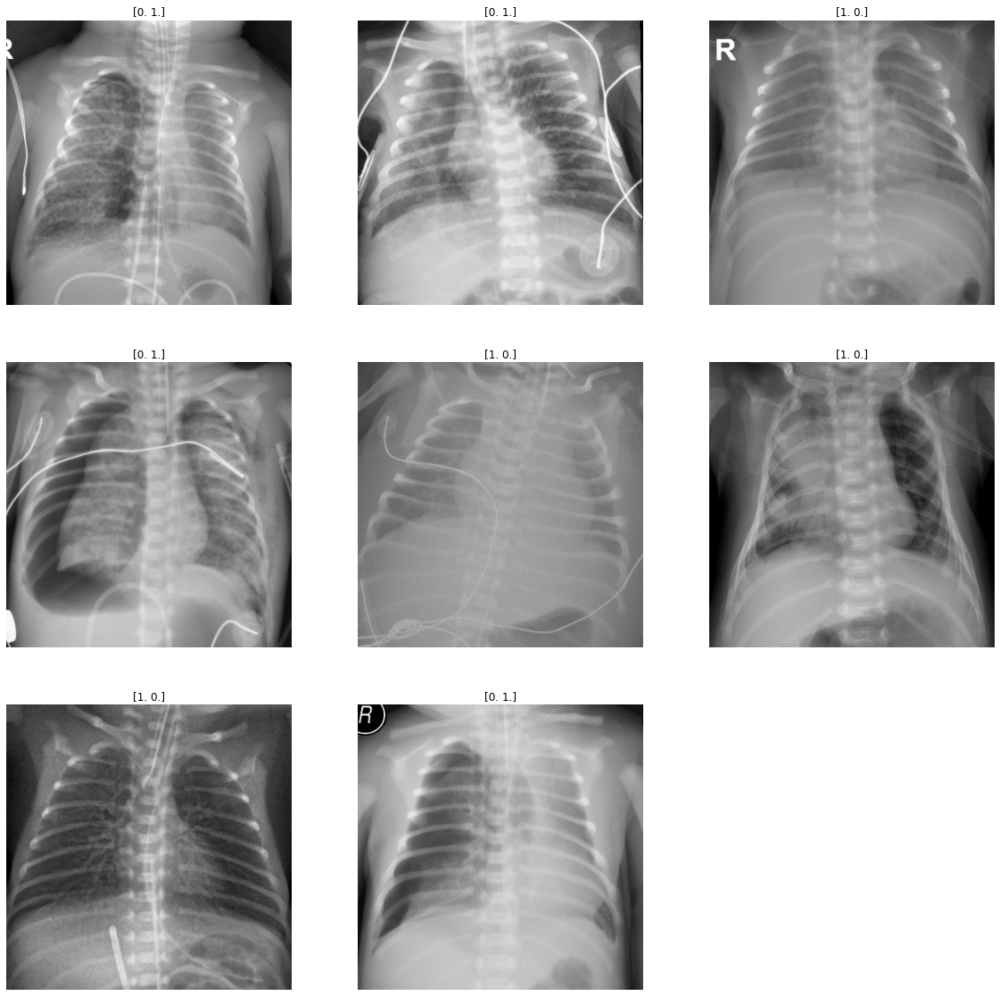

(32, 384, 384, 3) (32, 2)


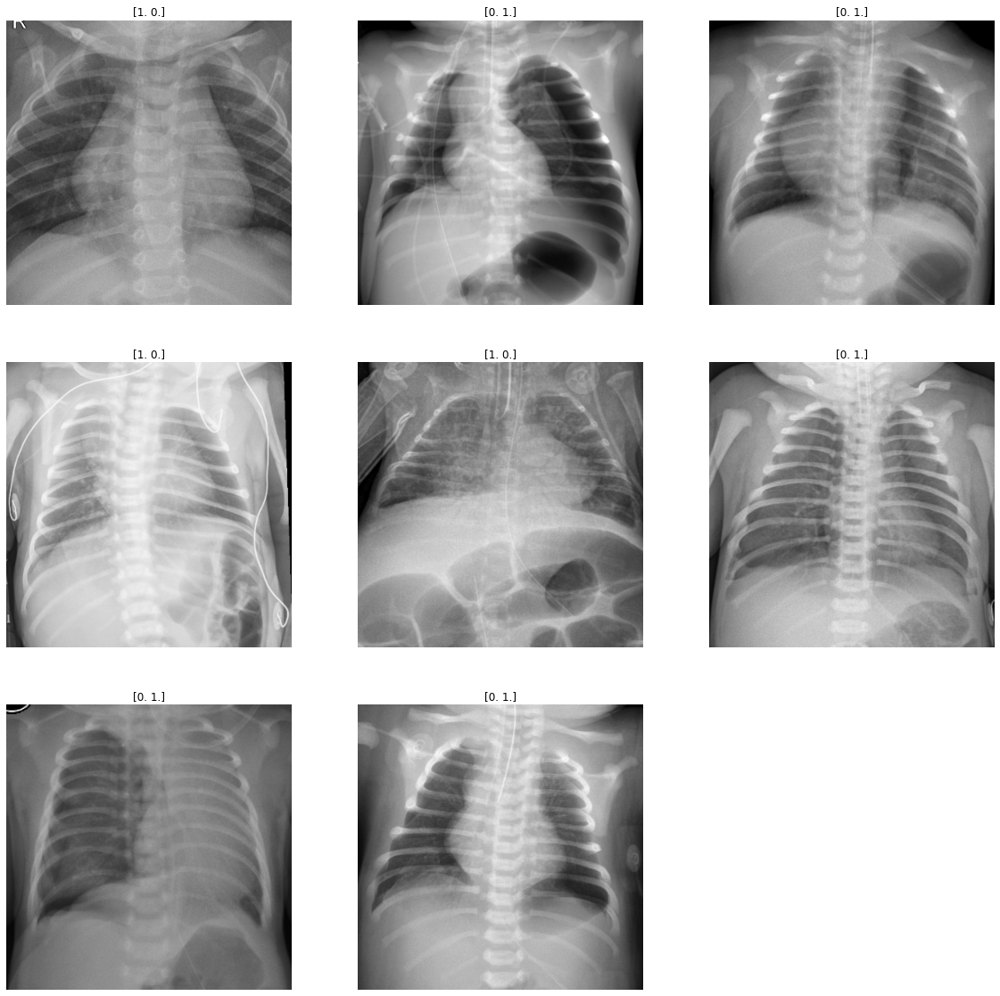

(32, 384, 384, 3) (32, 2)


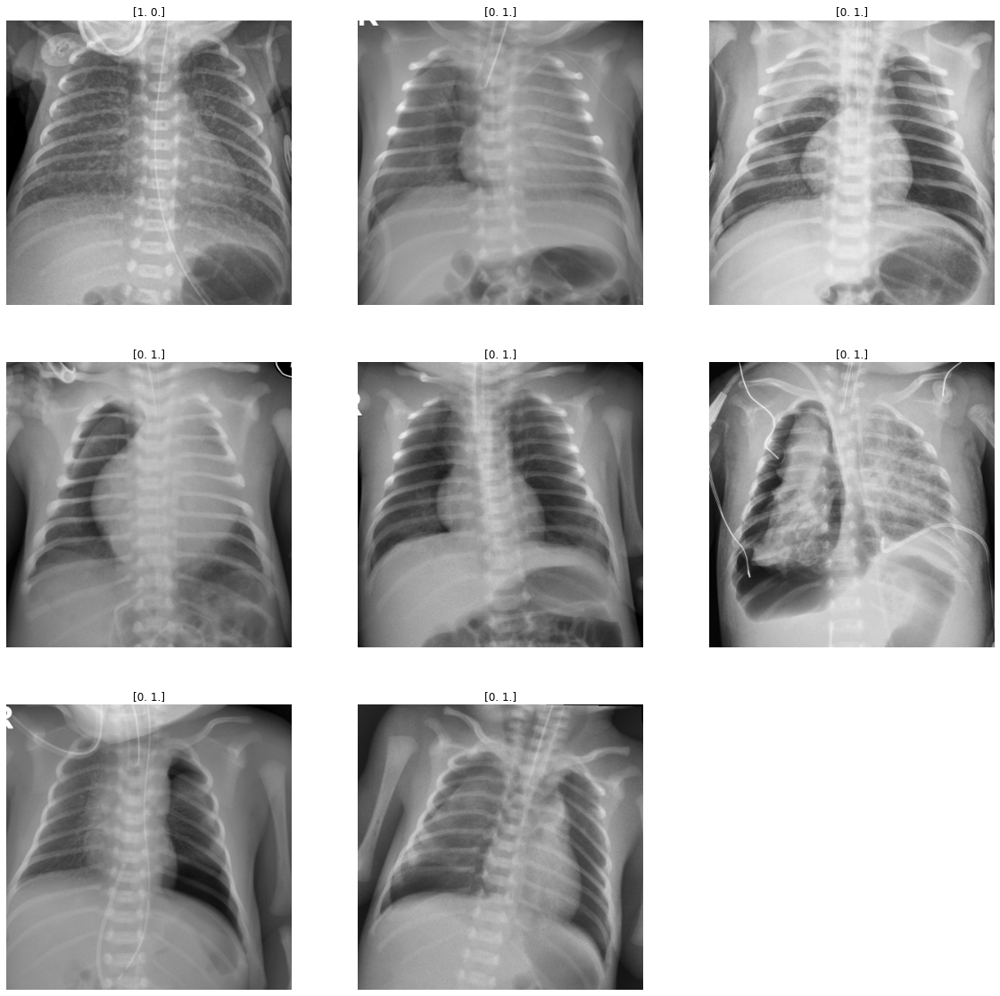

In [15]:
for images, labels in train_set.take(5):
    print(images.shape, labels.shape)
    plt.figure(figsize=(20, 20))
    for i in range(8):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(labels[i].numpy())
        plt.axis("off")
    plt.show()

In [ ]:
'''
import matplotlib.pyplot as plt

plt.figure(figsize = (10, 10))
for images, labels in valid_ds.take(1):
    print(images.shape, labels.shape)
    for i in range(9):
        ax = plt.subplot(3, 3, i+1)
        img = images[i].numpy().astype("uint8")
        img = img[:,:,0]  # 이렇게 해야 grayscal image 보임
        plt.imshow(img, cmap ='gray')
        plt.axis('off')
        plt.title(class_names[np.argmax(labels[i], axis = None, out = None)])   
plt.show()
'''

'\nimport matplotlib.pyplot as plt\n\nplt.figure(figsize = (10, 10))\nfor images, labels in valid_ds.take(1):\n    print(images.shape, labels.shape)\n    for i in range(9):\n        ax = plt.subplot(3, 3, i+1)\n        img = images[i].numpy().astype("uint8")\n        img = img[:,:,0]  # 이렇게 해야 grayscal image 보임\n        plt.imshow(img, cmap =\'gray\')\n        plt.axis(\'off\')\n        plt.title(class_names[np.argmax(labels[i], axis = None, out = None)])   \nplt.show()\n'

# Hyperparameters

In [16]:


patch_size = (2, 2)  # 2-by-2 sized patches
dropout_rate = 0.5  # Dropout rate
num_heads = 8  # Attention heads
embed_dim = 64  # Embedding dimension
num_mlp = 512  # MLP layer size
qkv_bias = True  # Convert embedded patches to query, key, and values with a learnable additive value
window_size = 2  # Size of attention window
shift_size = 1  # Size of shifting window
image_dimension = 24  # Initial image size

num_patch_x = image_dimension // patch_size[0]
num_patch_y = image_dimension // patch_size[1]


'''patch_size = (2, 2)  # 2-by-2 sized patches
dropout_rate = 0.03  # Dropout rate
num_heads = 8  # Attention heads
embed_dim = 64  # Embedding dimension
num_mlp = 256  # MLP layer size
qkv_bias = True  # Convert embedded patches to query, key, and values with a learnable additive value
window_size = 2  # Size of attention window
shift_size = 1  # Size of shifting window
image_dimension = 256  # Initial image size
'''

'patch_size = (2, 2)  # 2-by-2 sized patches\ndropout_rate = 0.03  # Dropout rate\nnum_heads = 8  # Attention heads\nembed_dim = 64  # Embedding dimension\nnum_mlp = 256  # MLP layer size\nqkv_bias = True  # Convert embedded patches to query, key, and values with a learnable additive value\nwindow_size = 2  # Size of attention window\nshift_size = 1  # Size of shifting window\nimage_dimension = 256  # Initial image size\n'

In [17]:
#for l in tf.keras.applications.EfficientNetB2(
#             include_top=False,
#             weights=None,
#             input_tensor=tf.keras.Input(shape=(384, 384, 3))
#         ).layers:
#     print(l.name, l.output_shape)

#Hybrid Swin Transformer 관련 코드 - 가능하면 건드리지 마라

##Helper functions

In [18]:
def window_partition(x, window_size):
    _, height, width, channels = x.shape
    patch_num_y = height // window_size
    patch_num_x = width // window_size
    x = tf.reshape(
        x, shape=(-1, patch_num_y, window_size, patch_num_x, window_size, channels)
    )
    x = tf.transpose(x, (0, 1, 3, 2, 4, 5))
    windows = tf.reshape(x, shape=(-1, window_size, window_size, channels))
    return windows


def window_reverse(windows, window_size, height, width, channels):
    patch_num_y = height // window_size
    patch_num_x = width // window_size
    x = tf.reshape(
        windows,
        shape=(-1, patch_num_y, patch_num_x, window_size, window_size, channels),
    )
    x = tf.transpose(x, perm=(0, 1, 3, 2, 4, 5))
    x = tf.reshape(x, shape=(-1, height, width, channels))
    return x


class DropPath(layers.Layer):
    def __init__(self, drop_prob=None, **kwargs):
        super(DropPath, self).__init__(**kwargs)
        self.drop_prob = drop_prob

    def call(self, x):
        input_shape = tf.shape(x)
        batch_size = input_shape[0]
        rank = x.shape.rank
        shape = (batch_size,) + (1,) * (rank - 1)
        random_tensor = (1 - self.drop_prob) + tf.random.uniform(shape, dtype=x.dtype)
        path_mask = tf.floor(random_tensor)
        output = tf.math.divide(x, 1 - self.drop_prob) * path_mask
        return output

##Window based multi-head self-attention

In [19]:
class WindowAttention(layers.Layer):
    def __init__(
        self, dim, window_size, num_heads, qkv_bias=True, dropout_rate=0.0, **kwargs
    ):
        super(WindowAttention, self).__init__(**kwargs)
        self.dim = dim
        self.window_size = window_size
        self.num_heads = num_heads
        self.scale = (dim // num_heads) ** -0.5
        self.qkv = layers.Dense(dim * 3, use_bias=qkv_bias)
        self.dropout = layers.Dropout(dropout_rate)
        self.proj = layers.Dense(dim)

    def build(self, input_shape):
        num_window_elements = (2 * self.window_size[0] - 1) * (
            2 * self.window_size[1] - 1
        )
        self.relative_position_bias_table = self.add_weight(
            shape=(num_window_elements, self.num_heads),
            initializer=tf.initializers.Zeros(),
            trainable=True,
        )
        coords_h = np.arange(self.window_size[0])
        coords_w = np.arange(self.window_size[1])
        coords_matrix = np.meshgrid(coords_h, coords_w, indexing="ij")
        coords = np.stack(coords_matrix)
        coords_flatten = coords.reshape(2, -1)
        relative_coords = coords_flatten[:, :, None] - coords_flatten[:, None, :]
        relative_coords = relative_coords.transpose([1, 2, 0])
        relative_coords[:, :, 0] += self.window_size[0] - 1
        relative_coords[:, :, 1] += self.window_size[1] - 1
        relative_coords[:, :, 0] *= 2 * self.window_size[1] - 1
        relative_position_index = relative_coords.sum(-1)

        self.relative_position_index = tf.Variable(
            initial_value=tf.convert_to_tensor(relative_position_index), trainable=False
        )

    def call(self, x, mask=None):
        _, size, channels = x.shape
        head_dim = channels // self.num_heads
        x_qkv = self.qkv(x)
        x_qkv = tf.reshape(x_qkv, shape=(-1, size, 3, self.num_heads, head_dim))
        x_qkv = tf.transpose(x_qkv, perm=(2, 0, 3, 1, 4))
        q, k, v = x_qkv[0], x_qkv[1], x_qkv[2]
        q = q * self.scale
        k = tf.transpose(k, perm=(0, 1, 3, 2))
        attn = q @ k

        num_window_elements = self.window_size[0] * self.window_size[1]
        relative_position_index_flat = tf.reshape(
            self.relative_position_index, shape=(-1,)
        )
        relative_position_bias = tf.gather(
            self.relative_position_bias_table, relative_position_index_flat
        )
        relative_position_bias = tf.reshape(
            relative_position_bias, shape=(num_window_elements, num_window_elements, -1)
        )
        relative_position_bias = tf.transpose(relative_position_bias, perm=(2, 0, 1))
        attn = attn + tf.expand_dims(relative_position_bias, axis=0)

        if mask is not None:
            nW = mask.get_shape()[0]
            mask_float = tf.cast(
                tf.expand_dims(tf.expand_dims(mask, axis=1), axis=0), tf.float32
            )
            attn = (
                tf.reshape(attn, shape=(-1, nW, self.num_heads, size, size))
                + mask_float
            )
            attn = tf.reshape(attn, shape=(-1, self.num_heads, size, size))
            attn = keras.activations.softmax(attn, axis=-1)
        else:
            attn = keras.activations.softmax(attn, axis=-1)
        attn = self.dropout(attn)

        x_qkv = attn @ v
        x_qkv = tf.transpose(x_qkv, perm=(0, 2, 1, 3))
        x_qkv = tf.reshape(x_qkv, shape=(-1, size, channels))
        x_qkv = self.proj(x_qkv)
        x_qkv = self.dropout(x_qkv)
        return x_qkv

##The complete Swin Transformer model

In [20]:
class SwinTransformer(layers.Layer):
    def __init__(
        self, 
        dim,
        num_patch,
        num_heads,
        window_size=7,
        shift_size=0,
        num_mlp=1024,
        qkv_bias=True,
        dropout_rate=0.0,
        **kwargs,
    ):
        super(SwinTransformer, self).__init__(**kwargs)

        self.dim = dim  # number of input dimensions
        self.num_patch = num_patch  # number of embedded patches
        self.num_heads = num_heads  # number of attention heads
        self.window_size = window_size  # size of window
        self.shift_size = shift_size  # size of window shift
        self.num_mlp = num_mlp  # number of MLP nodes

        self.norm1 = layers.LayerNormalization(epsilon=1e-5)
        self.attn = WindowAttention(
            dim,
            window_size=(self.window_size, self.window_size),
            num_heads=num_heads,
            qkv_bias=qkv_bias,
            dropout_rate=dropout_rate,
        )
        self.drop_path = DropPath(dropout_rate)
        self.norm2 = layers.LayerNormalization(epsilon=1e-5)

        self.mlp = keras.Sequential(
            [
                layers.Dense(num_mlp),
                layers.Activation(keras.activations.gelu),
                layers.Dropout(dropout_rate),
                layers.Dense(dim),
                layers.Dropout(dropout_rate),
            ]
        )

        if min(self.num_patch) < self.window_size:
            self.shift_size = 0
            self.window_size = min(self.num_patch)

    def build(self, input_shape):
        if self.shift_size == 0:
            self.attn_mask = None
        else:
            height, width = self.num_patch
            h_slices = (
                slice(0, -self.window_size),
                slice(-self.window_size, -self.shift_size),
                slice(-self.shift_size, None),
            )
            w_slices = (
                slice(0, -self.window_size),
                slice(-self.window_size, -self.shift_size),
                slice(-self.shift_size, None),
            )
            mask_array = np.zeros((1, height, width, 1))
            count = 0
            for h in h_slices:
                for w in w_slices:
                    mask_array[:, h, w, :] = count
                    count += 1
            mask_array = tf.convert_to_tensor(mask_array)

            # mask array to windows
            mask_windows = window_partition(mask_array, self.window_size)
            mask_windows = tf.reshape(
                mask_windows, shape=[-1, self.window_size * self.window_size]
            )
            attn_mask = tf.expand_dims(mask_windows, axis=1) - tf.expand_dims(
                mask_windows, axis=2
            )
            attn_mask = tf.where(attn_mask != 0, -100.0, attn_mask)
            attn_mask = tf.where(attn_mask == 0, 0.0, attn_mask)
            self.attn_mask = tf.Variable(initial_value=attn_mask, trainable=False)

    def call(self, x):
        height, width = self.num_patch
        _, num_patches_before, channels = x.shape
        x_skip = x
        x = self.norm1(x)
        x = tf.reshape(x, shape=(-1, height, width, channels))
        if self.shift_size > 0:
            shifted_x = tf.roll(
                x, shift=[-self.shift_size, -self.shift_size], axis=[1, 2]
            )
        else:
            shifted_x = x

        x_windows = window_partition(shifted_x, self.window_size)
        x_windows = tf.reshape(
            x_windows, shape=(-1, self.window_size * self.window_size, channels)
        )
        attn_windows = self.attn(x_windows, mask=self.attn_mask)

        attn_windows = tf.reshape(
            attn_windows, shape=(-1, self.window_size, self.window_size, channels)
        )
        shifted_x = window_reverse(
            attn_windows, self.window_size, height, width, channels
        )
        if self.shift_size > 0:
            x = tf.roll(
                shifted_x, shift=[self.shift_size, self.shift_size], axis=[1, 2]
            )
        else:
            x = shifted_x

        x = tf.reshape(x, shape=(-1, height * width, channels))
        x = self.drop_path(x)
        x = x_skip + x
        x_skip = x
        x = self.norm2(x)
        x = self.mlp(x)
        x = self.drop_path(x)
        x = x_skip + x
        return x

In [21]:
class PatchExtract(layers.Layer):
    def __init__(self, patch_size, **kwargs):
        super(PatchExtract, self).__init__(**kwargs)
        self.patch_size_x = patch_size[0]
        self.patch_size_y = patch_size[0]

    def call(self, images):
        batch_size = tf.shape(images)[0]
        patches = tf.image.extract_patches(
            images=images,
            sizes=(1, self.patch_size_x, self.patch_size_y, 1),
            strides=(1, self.patch_size_x, self.patch_size_y, 1),
            rates=(1, 1, 1, 1),
            padding="VALID",
        )
        patch_dim = patches.shape[-1]
        patch_num = patches.shape[1]
        return tf.reshape(patches, (batch_size, patch_num * patch_num, patch_dim))


class PatchEmbedding(layers.Layer):
    def __init__(self, num_patch, embed_dim, **kwargs):
        super(PatchEmbedding, self).__init__(**kwargs)
        self.num_patch = num_patch
        self.proj = layers.Dense(embed_dim)
        self.pos_embed = layers.Embedding(input_dim=num_patch, output_dim=embed_dim)

    def call(self, patch):
        pos = tf.range(start=0, limit=self.num_patch, delta=1)
        return self.proj(patch) + self.pos_embed(pos)


class PatchMerging(tf.keras.layers.Layer):
    def __init__(self, num_patch, embed_dim):
        super(PatchMerging, self).__init__()
        self.num_patch = num_patch
        self.embed_dim = embed_dim
        self.linear_trans = layers.Dense(2 * embed_dim, use_bias=False)

    def call(self, x):
        height, width = self.num_patch
        _, _, C = x.get_shape().as_list()
        x = tf.reshape(x, shape=(-1, height, width, C))
        feat_maps = x
     
        x0 = x[:, 0::2, 0::2, :]
        x1 = x[:, 1::2, 0::2, :]
        x2 = x[:, 0::2, 1::2, :]
        x3 = x[:, 1::2, 1::2, :]
        x = tf.concat((x0, x1, x2, x3), axis=-1)
        x = tf.reshape(x, shape=(-1, (height // 2) * (width // 2), 4 * C))
        return self.linear_trans(x), feat_maps

##Hybrid-Swin-Transformer

In [22]:
import numpy as np 
import tensorflow as tf 
from tensorflow import keras 
from tensorflow.keras import Model, Sequential, Input, layers, applications

In [23]:
BASE_WEIGHTS = '/content/drive/MyDrive/Programming and AI/Pneumothorax_pratice/hybrid-swin-weights/'

IMG_NET    = [
    'imagenet/imagenet.notop-b0.h5',
    'imagenet/imagenet.notop-b1.h5',
    'imagenet/imagenet.notop-b2.h5'
]

NOISY_STUD = [
    'noisystudent/noisy.student.notop-b0.h5',
    'noisystudent/noisy.student.notop-b1.h5',
    'noisystudent/noisy.student.notop-b2.h5',
]

ADV_PROB = [
    'advprob/adv.prop.notop-b0.h5',
    'advprob/adv.prop.notop-b1.h5',
    'advprob/adv.prop.notop-b2.h5'
]

(2, 2)


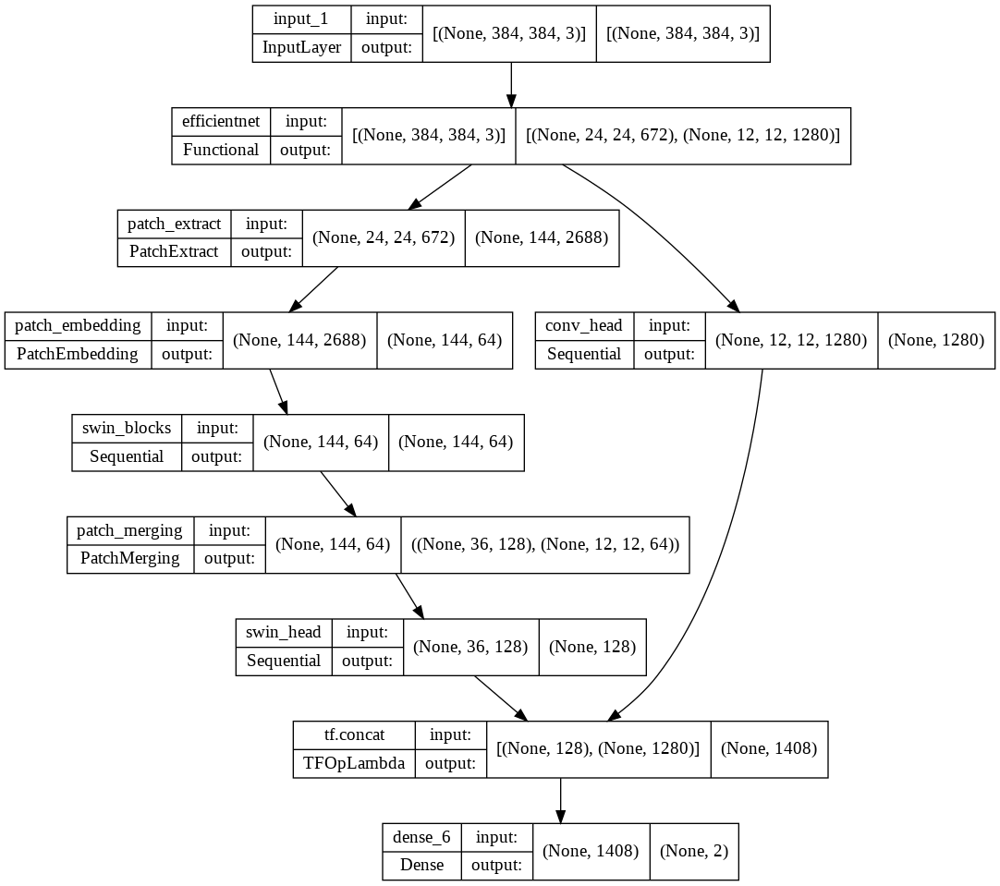

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 384, 384, 3  0           []                               
                                )]                                                                
                                                                                                  
 efficientnet (Functional)      [(None, 24, 24, 672  4049571     ['input_2[0][0]']                
                                ),                                                                
                                 (None, 12, 12, 128                                               
                                0)]                                                               
                                                                                            

In [26]:
class HybridSwinTransformer(keras.Model):
    def __init__(self):
        super(HybridSwinTransformer, self).__init__()
        # base models 
        self.inputx = keras.Input((img_size, img_size, 3), name='input_hybrids')
        base = applications.EfficientNetB0(
            include_top=False,
            #내가 IMG_NET weight로 바꿈
            weights=BASE_WEIGHTS + IMG_NET[0], # 'imagenet/imagenet.notop-b0.h5',
            #weights=BASE_WEIGHTS + ADV_PROB[0],
            input_tensor=self.inputx
        )
        
        # base model with compatible output which will be an input of transformer model 
        self.new_base = keras.Model(
            [base.inputs], 
            [
                base.get_layer('block6a_expand_activation').output, 
                base.output
            ], # output with 192 feat_maps
            name='efficientnet'
        )
        
        # stuff of swin transformers 
        self.patch_extract  = PatchExtract(patch_size)
        self.patch_embedds  = PatchEmbedding(num_patch_x * num_patch_y, embed_dim)
        self.patch_merging  = PatchMerging((num_patch_x, num_patch_y), embed_dim=embed_dim)
        
        # swin blocks containers 
        self.swin_sequences = keras.Sequential(name='swin_blocks')
        for i in range(shift_size):
            self.swin_sequences.add(
                SwinTransformer(
                    dim=embed_dim,
                    num_patch=(num_patch_x, num_patch_y),
                    num_heads=num_heads,
                    window_size=window_size,
                    shift_size=i,
                    num_mlp=num_mlp,
                    qkv_bias=qkv_bias,
                    dropout_rate=dropout_rate
                )
            )
        
        # swin block's head
        self.swin_head = keras.Sequential(
            [
                layers.GlobalAveragePooling1D(),
                layers.AlphaDropout(0.5),
                layers.BatchNormalization(),
            ], name='swin_head'
        )
        
        # base model's (cnn model) head
        self.conv_head = keras.Sequential(
            [
                layers.GlobalAveragePooling2D(),
                layers.AlphaDropout(0.5),
            ], name='conv_head'
        )
        
        # classifier
        #self.classifier  = layers.Dense(class_number, activation = 'softmax')
        self.classifier = layers.Dense(class_number, dtype='float32')
        

        
    def call(self, inputs, training=None, **kwargs):
        x , base_gcam_top = self.new_base(inputs)
        x = self.patch_extract(x)
        x = self.patch_embedds(x)
        x = self.swin_sequences(x)
        x, swin_gcam_top = self.patch_merging(x)
        
        swin_top = self.swin_head(x)
        conv_top = self.conv_head(base_gcam_top)
        preds = self.classifier(tf.concat([swin_top, conv_top], axis=-1))
        
        if training: # training phase 
            return preds
        else: # inference phase
            return preds, base_gcam_top, swin_gcam_top

    def build_graph(self):
        x = keras.Input(shape=(img_size, img_size, 3))
        return keras.Model(inputs=[x], outputs=self.call(x))
    
keras.backend.clear_session()
model = HybridSwinTransformer()
print(model(tf.ones((2, img_size, img_size, 3)))[0].shape)
display(keras.utils.plot_model(model.build_graph(), 
                               show_shapes=True,
                               show_layer_names=True, 
                               expand_nested=False))
model.build_graph().summary()

#Model building and training

In [39]:
from tensorflow.keras import losses, optimizers , metrics
from tensorflow.keras import callbacks
from tensorflow_addons import optimizers as tfa_optimizers

rlr = callbacks.ReduceLROnPlateau(monitor="val_accuracy", factor=0.3, patience=2)
ckp_path = '/content/drive/MyDrive/Programming and AI/Pneumothorax_pratice/hybrid-swin-weights/my_model/'
ckp_file_path = ckp_path + 'efficientnet_384_model_flip.h5'
ckp = callbacks.ModelCheckpoint(ckp_file_path,
                                monitor="val_accuracy", 
                                verbose=1,
                                save_best_only=True, 
                                save_weights_only=True,
                                mode="max")
early_stop = callbacks.EarlyStopping(patience = 30, restore_best_weights = True)

In [40]:
loss_fn = losses.CategoricalCrossentropy(label_smoothing=0.1, from_logits = True) # label이 [1,0], [0,1] 처럼 one hot conding일 때
#loss_fn = losses.SparseCategoricalCrossentropy(from_logits=True) #label이 0, 1 integer임.

##wandb config

In [38]:
'''
import wandb
from wandb.keras import WandbCallback

# Initialize wandb with your project name
wandb.login(key = 'dac2af947b97c7a27440d072fd08b000170bc21e')
run = wandb.init(project='my-keras-integration', reinit = True)
config = wandb.config  # We'll use this to configure our experiment
'''


wandb: WARNING Calling wandb.login() after wandb.init() has no effect.


In [30]:
'''
#Parameters for general
config.class_number = class_number
config.seed = seed
config.img_size = img_size
config.batch_size = batch_size
config.epochs = epochs
config.learning_rate = 1e-4
config.weight_decay = 1e-5
#config.loss_fn = loss_fn
config.loss_fn = losses.CategoricalCrossentropy()

#Parameters for hybid SWIN
config.patch_size = patch_size  # 2-by-2 sized patches
config.dropout_rate = dropout_rate
config.num_heads = num_heads
config.embed_dim = embed_dim
config.num_mlp = num_mlp
config.qkv_bias = qkv_bias
config.window_size = window_size
config.shift_size = shift_size
config.image_dimension = image_dimension
'''

## Build the model

In [41]:
# compile and run
model.compile(
    loss=loss_fn,
    optimizer=tfa_optimizers.AdamW(learning_rate=learning_rate, weight_decay = weight_decay), 
    metrics = [
               keras.metrics.CategoricalAccuracy(name='accuracy'),
               #keras.metrics.TopKCategoricalAccuracy(3, name = 'top_3_accuracy'),
               #keras.metrics.AUC(name = 'AUC'),
               #keras.metrics.TruePositives(name = 'TP'),
               #keras.metrics.TrueNegatives(name = 'TN'),
               #keras.metrics.FalsePositives(name = 'FP'),
               #keras.metrics.FalseNegatives(name = 'FN')
    ])

# ISSUE: ValueError: Unable to create dataset (name already exists)
# [ugly workaround!]
for i in range(len(model.weights)):
    model.weights[i]._handle_name = model.weights[i].name +  str(i)

NameError: ignored

In [34]:
#training
history = model.fit(train_ds,
                    validation_data = valid_ds,
                    batch_size = config.batch_size,
                    epochs=config.epochs,
#                    callbacks = [WandbCallback()])

                    callbacks=[WandbCallback(save_model = False, save_weight_only = True), early_stop, ckp, rlr])
wandb.run.finish()
                

Epoch 1/100


InvalidArgumentError: ignored

#Model training and evaluation

##Model compile and training

In [ ]:
plt.plot(history.history["loss"], label="train_loss")
plt.plot(history.history["val_loss"], label="val_loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Train and Validation Losses Over Epochs", fontsize=14)
plt.legend()
plt.grid()
plt.show()

In [ ]:
def vis(history,name) :
    plt.title(f"{name.upper()}")
    plt.xlabel('epochs')
    plt.ylabel(f"{name.lower()}")
    value = history.history.get(name)
    val_value = history.history.get(f"val_{name}",None)
    epochs = range(1, len(value)+1)
    plt.plot(epochs, value, 'b-', label=f'training {name}')
    if val_value is not None :
        plt.plot(epochs, val_value, 'r:', label=f'validation {name}')
    plt.legend(loc='upper right', bbox_to_anchor=(0.05, 1.2) , fontsize=10 , ncol=1)
    
def plot_history(history) :
    key_value = list(set([i.split("val_")[-1] for i in list(history.history.keys())]))
    plt.figure(figsize=(25, 4))
    for idx , key in enumerate(key_value) :
        plt.subplot(1, len(key_value), idx+1)
        vis(history, key)
    plt.tight_layout()
    plt.show()

In [ ]:
plot_history(history)

##Model test

In [ ]:
a = model.evaluate(test_set)
print(a)


In [ ]:
plt.figure(figsize = (10, 10))
for images, labels in test_set.take(1):
    print(images.shape, labels.shape)
    for i in range(4):
        ax = plt.subplot(2, 2, i+1)
        img = images[i].numpy().astype("uint8")
        img = img[:,:,0]  # 이렇게 해야 grayscal image 보임
        plt.imshow(img, cmap ='gray')
        plt.axis('off')
        label_int = np.argmax(labels[i], axis = None, out = None)
        cls_name = class_names[label_int]
        title = str(label_int) + '/' + str(cls_name)
        plt.title(title)
plt.show()

In [ ]:
y_pred = model.predict(test_set)
y_pred = np.argmax(y_pred[0], axis = 1)
print(y_pred)
y_true = np.argmax(np.concatenate([y for x, y in test_set], axis = 0), axis = 1)
print(y_true)

In [ ]:
from sklearn.metrics import classification_report
target_names = ['Normal', 'Pneumothorax'] 
print(classification_report(y_true, y_pred, target_names = target_names))

In [ ]:
history.history.keys()
#dict_keys(['loss', 'accuracy', 'get_f1', 'val_loss', 'val_accuracy', 'val_get_f1'])

#GradCam

In [ ]:
def plot_stuff(inputs, features_a, features_b):
    plt.figure(figsize=(25, 25))
    
    plt.subplot(1, 3, 1)
    plt.axis('off')
    plt.imshow(tf.squeeze(inputs/255, axis=0))
    plt.title('Input')
    
    plt.subplot(1, 3, 2)
    plt.axis('off')
    plt.imshow(features_a)
    plt.title('CNN')
    
    plt.subplot(1, 3, 3)
    plt.axis('off')
    plt.imshow(features_b)
    plt.title('Hybrid-CNN-Transformer')
    plt.show()

# ref: https://keras.io/examples/vision/grad_cam/
def get_img_array(img):
    array = keras.utils.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    return array

# ref: https://keras.io/examples/vision/grad_cam/
def make_gradcam_heatmap(img_array, grad_model, pred_index=None):
    with tf.GradientTape(persistent=True) as tape:
        preds, base_top, swin_top = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # CNN layer에서 gradcam 가져오기    
    grads = tape.gradient(class_channel, base_top)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    base_top = base_top[0]
    heatmap_a = base_top @ pooled_grads[..., tf.newaxis]
    heatmap_a = tf.squeeze(heatmap_a)
    heatmap_a = tf.maximum(heatmap_a, 0) / tf.math.reduce_max(heatmap_a)
    heatmap_a = heatmap_a.numpy()
    
    #SWIN layer에서 gradcam 가져오기
    grads = tape.gradient(class_channel, swin_top)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    swin_top = swin_top[0]
    heatmap_b = swin_top @ pooled_grads[..., tf.newaxis]
    heatmap_b = tf.squeeze(heatmap_b)
    heatmap_b = tf.maximum(heatmap_b, 0) / tf.math.reduce_max(heatmap_b)
    heatmap_b = heatmap_b.numpy()
    return heatmap_a, heatmap_b

In [ ]:
model.load_weights('/content/drive/MyDrive/Programming and AI/Pneumothorax_pratice/hybrid-swin-weights/my_model/384_model_flip.h5')

img_arrays = next(iter(test_set))[0]; print(img_arrays.shape)

for img_arrays in img_arrays:
    img_array = get_img_array(img_arrays)
    cnn_heatmap, swin_heatmap = make_gradcam_heatmap(img_array, model)
    print(cnn_heatmap.shape, cnn_heatmap.max(), cnn_heatmap.min())
    print(swin_heatmap.shape, swin_heatmap.max(), swin_heatmap.min())

    plot_stuff(img_array, cnn_heatmap, swin_heatmap)

In [ ]:
import cv2
def save_and_display_gradcam(img, 
                             heatmap, 
                             target=None, 
                             pred=None,
                             cam_path="cam.jpg",  
                             alpha=0.5, 
                             plot=None):
    # Rescale heatmap to a range 0-255
    heatmap = np.uint8(255 * heatmap)

    # Use jet colormap to colorize heatmap
    jet = cm.get_cmap("jet") 

    # Use RGB values of the colormap
    jet_colors  = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    # Create an image with RGB colorized heatmap
    jet_heatmap = keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img.shape[0], img.shape[1]))
    jet_heatmap = keras.utils.img_to_array(jet_heatmap)

    # Superimpose the heatmap on original image
    superimposed_img = jet_heatmap * alpha + img
    superimposed_img = keras.utils.array_to_img(superimposed_img)
    return superimposed_img

In [ ]:
#Data를 불러올 때 nearest로 불러왔더니 영상이 깨지더라.. 답은 bilinear로 바꿔야 한다.

samples, labels = next(iter(val_set))

for sample, labels in zip(samples, labels):
    img_array = sample[tf.newaxis, ...]
    heatmap_a, heatmap_b = make_gradcam_heatmap(img_array, model)
    overlay_a = save_and_display_gradcam(sample, heatmap_a)
    overlay_b = save_and_display_gradcam(sample, heatmap_b)
    print(labels)
    plot_stuff(img_array, overlay_a, overlay_b)


In [ ]:
while True:
    pass